In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
fp1 = r"C:\SEM6\PCPO\p7\cat.jpg"  # 1280 x 781
fp2 = r"C:\SEM6\PCPO\p7\chessboard.jpg"  # 1237 x 1235

In [3]:
def sift(img_filepath, nfeatures=0, nOctaveLayers=3, contrastThreshold=0.04, edgeThreshold=10, sigma=1.6):
    """
    Parameters
        img_filepath     filepath to RGB image
        nfeatures	The number of best features to retain. The features are ranked by their scores (measured in SIFT algorithm as the local contrast)
        nOctaveLayers	The number of layers in each octave. 3 is the value used in D. Lowe paper. The number of octaves is computed automatically from the image resolution.
        contrastThreshold	The contrast threshold used to filter out weak features in semi-uniform (low-contrast) regions. The larger the threshold, the less features are produced by the detector.
        edgeThreshold	The threshold used to filter out edge-like features. Note that the its meaning is different from the contrastThreshold, i.e. the larger the edgeThreshold, the less features are filtered out (more features are retained).
        sigma	The sigma of the Gaussian applied to the input image at the octave #0. If your image is captured with a weak camera with soft lenses, you might want to reduce the number.
    Note
        The contrast threshold will be divided by nOctaveLayers when the filtering is applied. When nOctaveLayers is set to default and if you want to use the value used in D. Lowe paper, 0.03, set this argument to 0.09.
    
    # https://docs.opencv.org/3.4/da/df5/tutorial_py_sift_intro.html
    # https://docs.opencv.org/4.x/d7/d60/classcv_1_1SIFT.html
    """
    img = cv2.imread(img_filepath)
    img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create(nfeatures, nOctaveLayers, contrastThreshold, edgeThreshold, sigma)
    keypoints = sift.detect(img_grey, None)
    zdjecie = cv2.drawKeypoints(img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    # cv2.imshow(f"Detektor SIFT, {nfeatures=} {nOctaveLayers=} {contrastThreshold=} {edgeThreshold=} {sigma=}", zdjecie)
    # if cv2.waitKey(0) & 0xff == 27:
    #     cv2.destroyAllWindows()
    return zdjecie, keypoints

In [4]:
def mser(img_filepath):
    """
    # https://docs.opencv.org/4.x/d3/d28/classcv_1_1MSER.html
    """
    img = cv2.imread(img_filepath)
    img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    mser = cv2.MSER_create()  # domyślne parametry
    regions, boundingBoxes  = mser.detectRegions(img_grey)
    hulls = [cv2.convexHull(p.reshape(-1, 1, 2)) for p in regions]
    # cv2.polylines(img, hulls, 1, (0, 255, 0))
    # cv2.imshow('img', img)
    # cv2.waitKey(0)
    # cv2.destroyAllWindows()
    return hulls, regions, boundingBoxes

# Detektor SIFT (Scale Invariant Feature Transform)

## Różne wartości parametru nfeatures

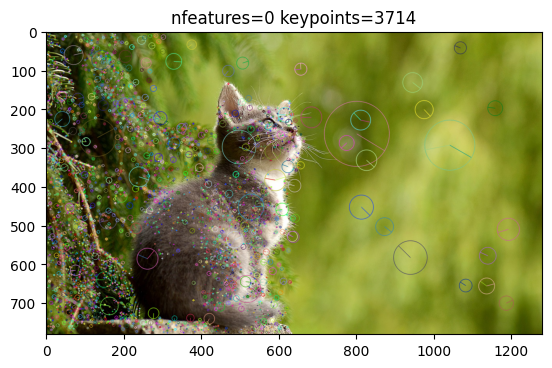

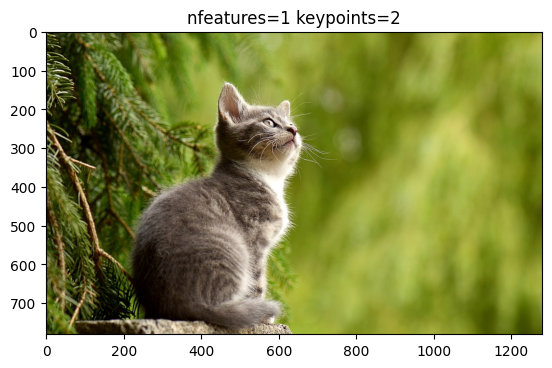

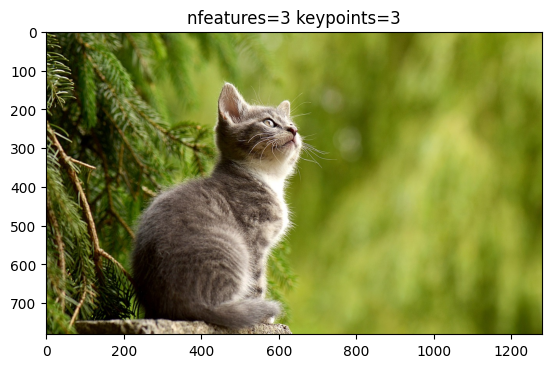

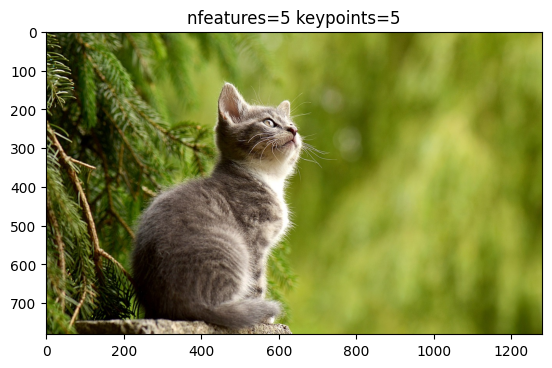

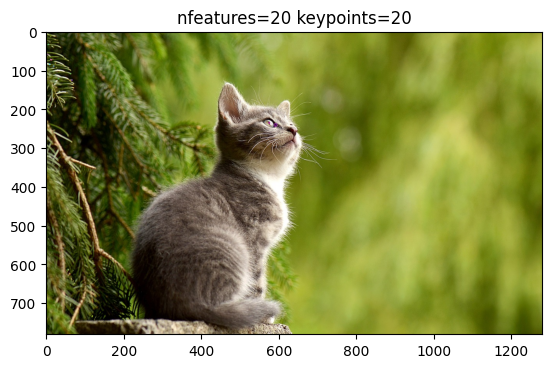

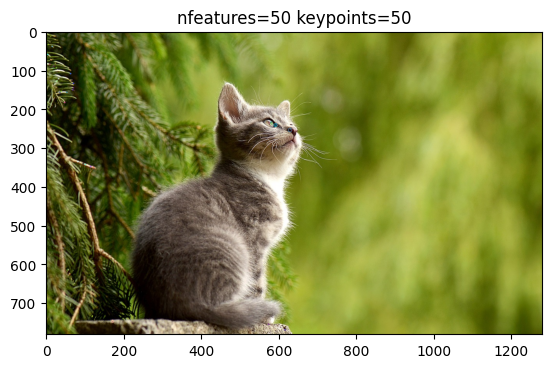

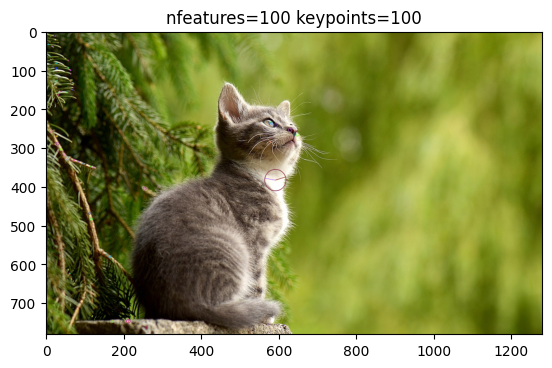

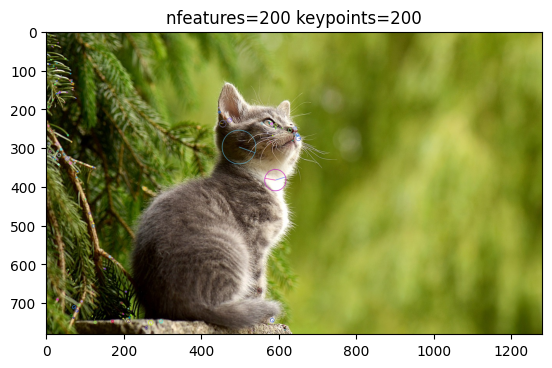

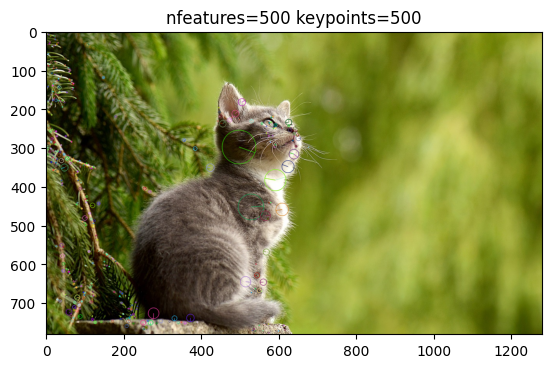

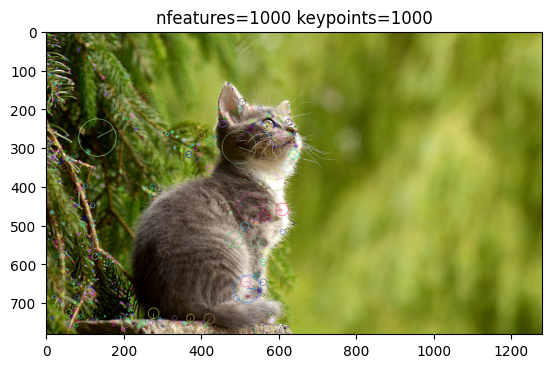

In [5]:
nfeatures = [0, 1, 3, 5, 20, 50, 100, 200, 500, 1000]
detected_points = []
for n in nfeatures:
    img, kp = sift(img_filepath=fp1, nfeatures=n)
    detected_points.append(len(kp))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"nfeatures={n} keypoints={len(kp)}")
    plt.show()

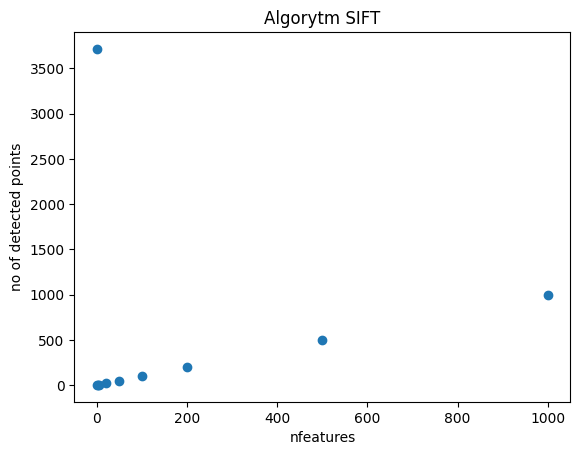

In [6]:
plt.scatter(nfeatures, detected_points)
plt.xlabel("nfeatures")
plt.ylabel("no of detected points")
plt.title("Algorytm SIFT")
plt.show()

## Różne wartości parametru nOctaveLayers

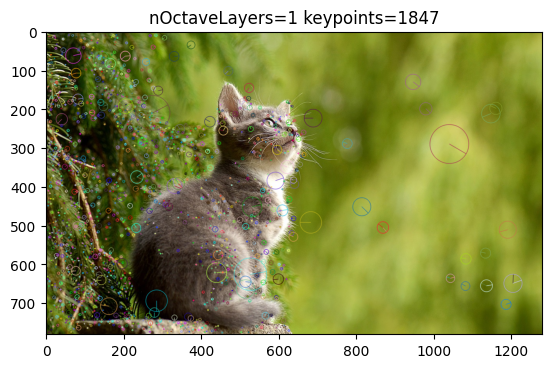

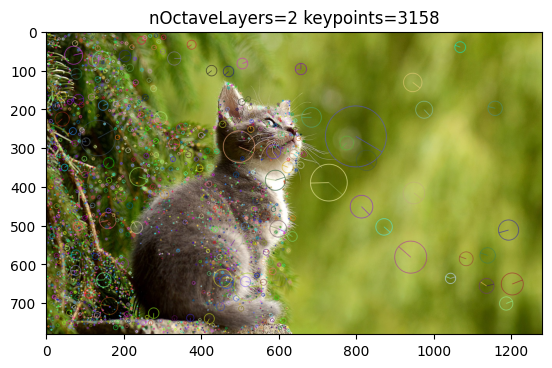

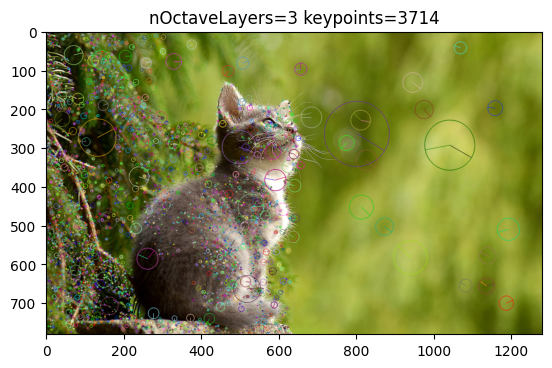

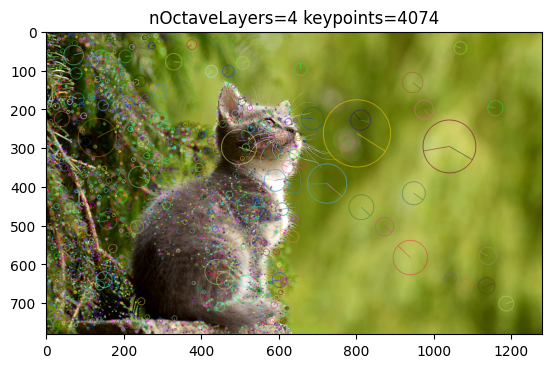

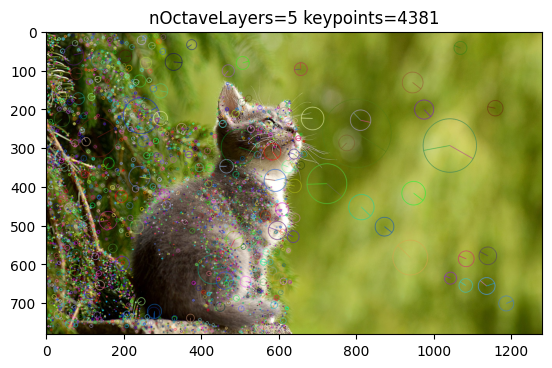

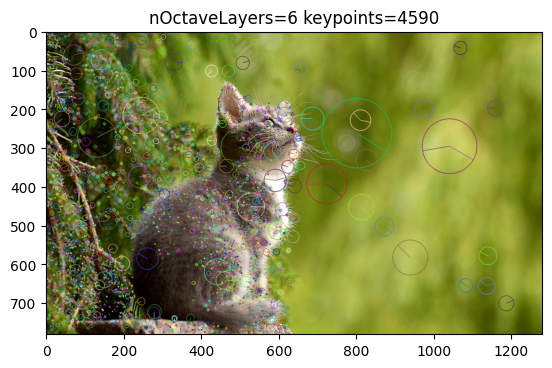

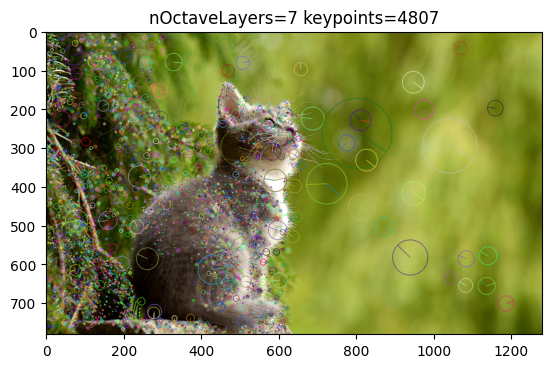

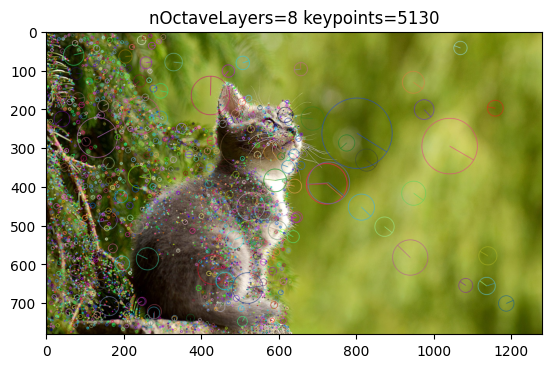

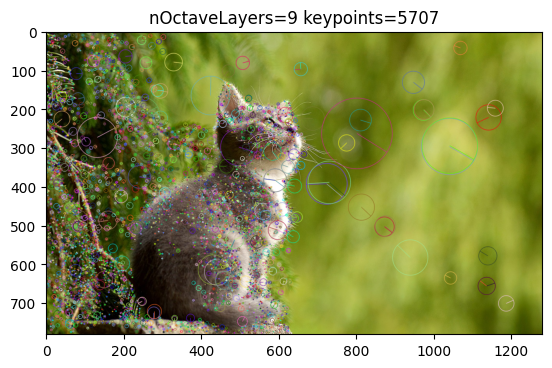

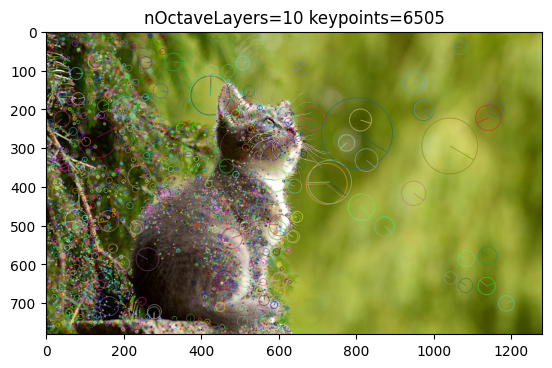

In [7]:
nOctaveLayers = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
detected_points = []
for n in nOctaveLayers:
    img, kp = sift(img_filepath=fp1, nOctaveLayers=n)
    detected_points.append(len(kp))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"nOctaveLayers={n} keypoints={len(kp)}")
    plt.show()

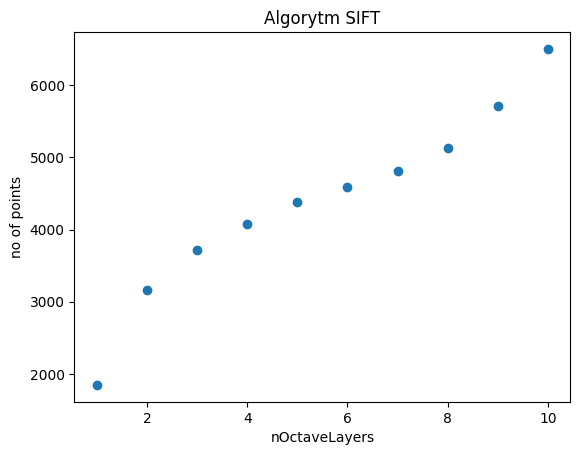

In [8]:
plt.scatter(nOctaveLayers, detected_points)
plt.xlabel("nOctaveLayers")
plt.ylabel("no of points")
plt.title("Algorytm SIFT")
plt.show()

## Różne wartości parametru contrastThreshold

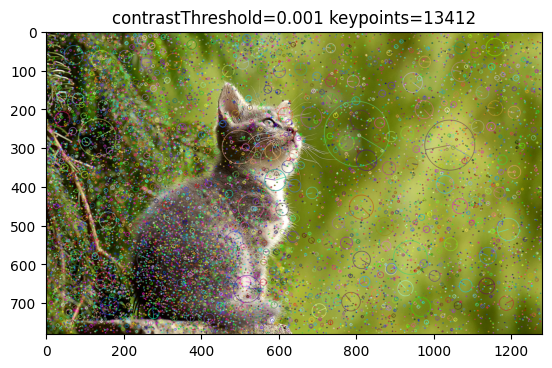

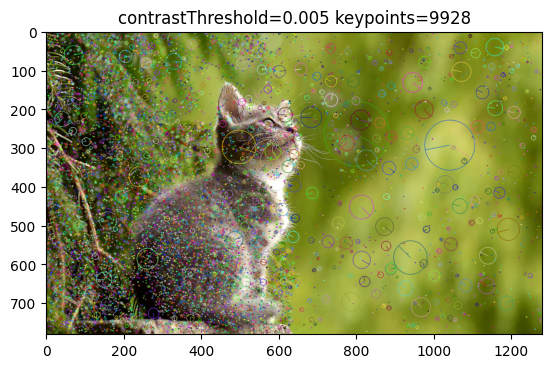

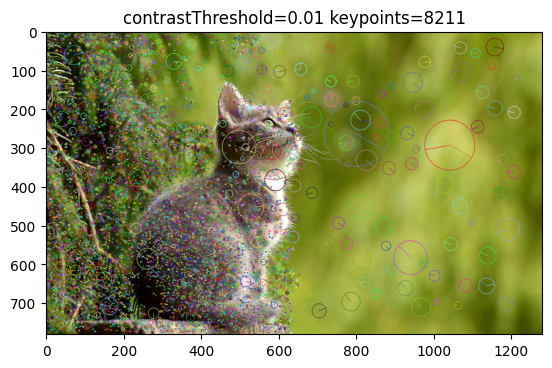

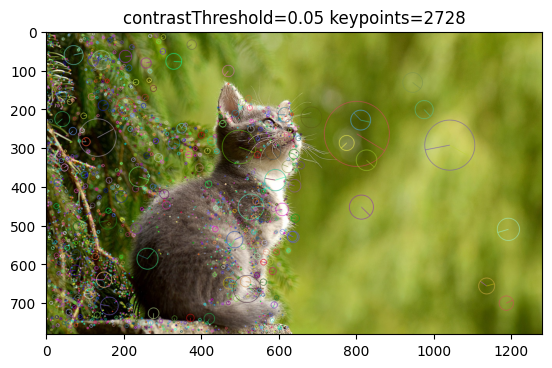

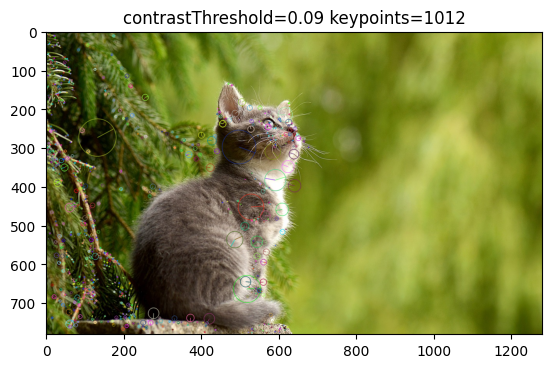

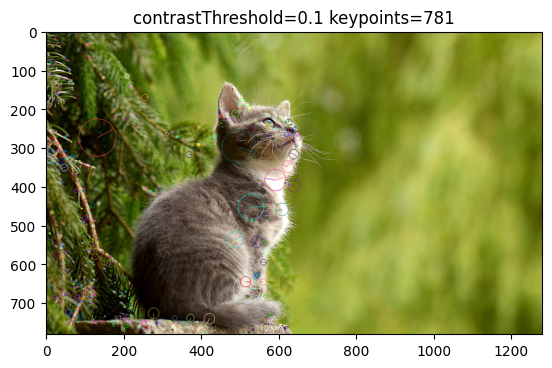

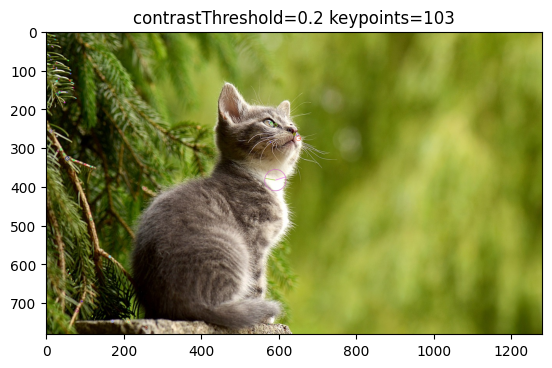

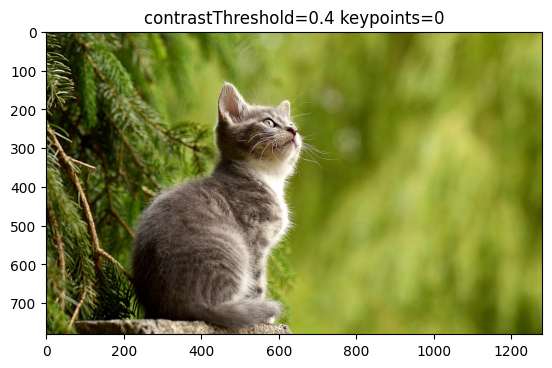

In [9]:
contrastThreshold = [0.001, 0.005, 0.01, 0.05, 0.09, 0.1, 0.2, 0.4]
detected_points = []
for n in contrastThreshold:
    img, kp = sift(img_filepath=fp1, contrastThreshold=n)
    detected_points.append(len(kp))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"contrastThreshold={n} keypoints={len(kp)}")
    plt.show()

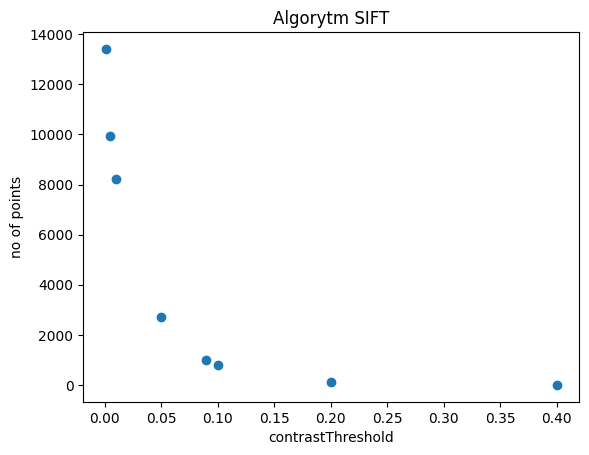

In [10]:
plt.scatter(contrastThreshold, detected_points)
plt.xlabel("contrastThreshold")
plt.ylabel("no of points")
plt.title("Algorytm SIFT")
plt.show()

## Różne wartości parametru edgeThreshold

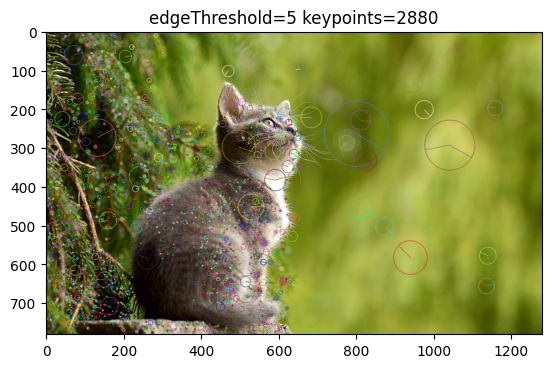

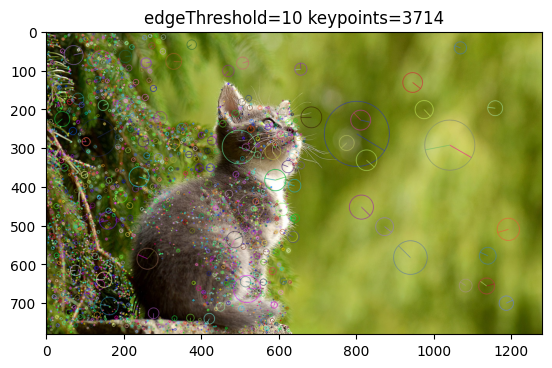

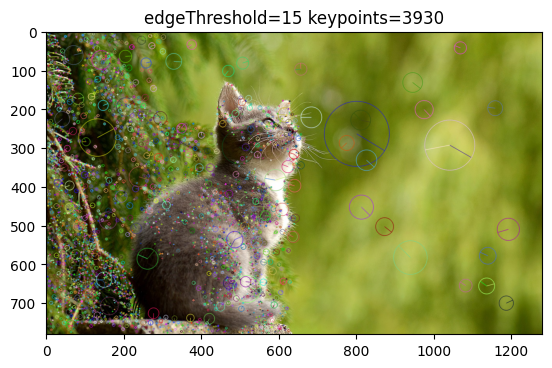

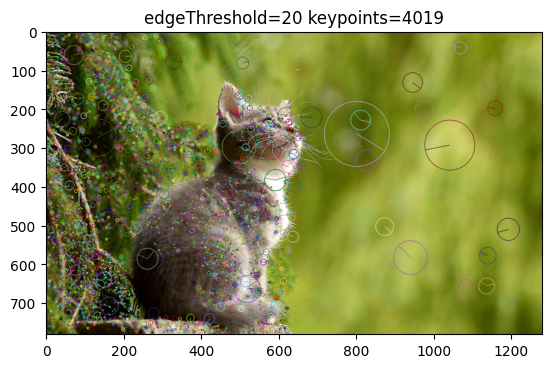

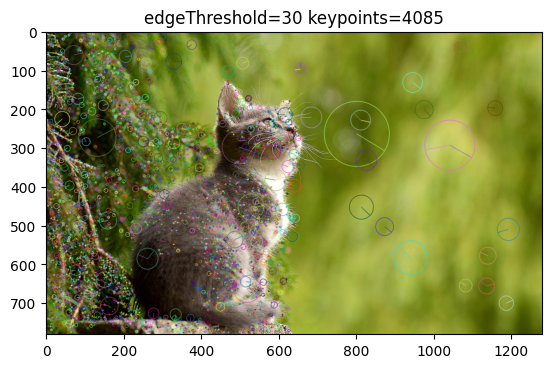

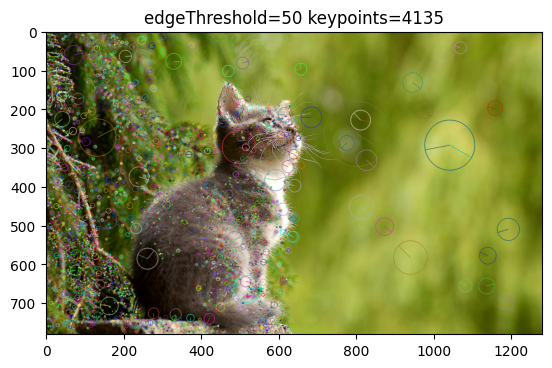

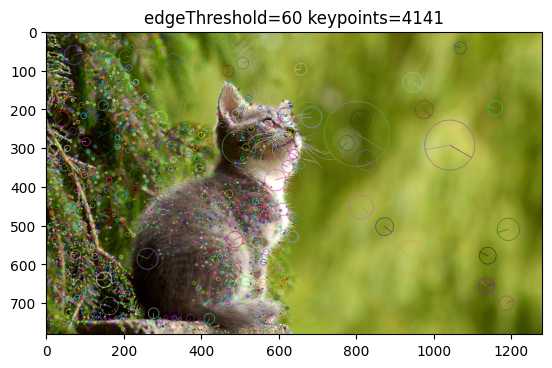

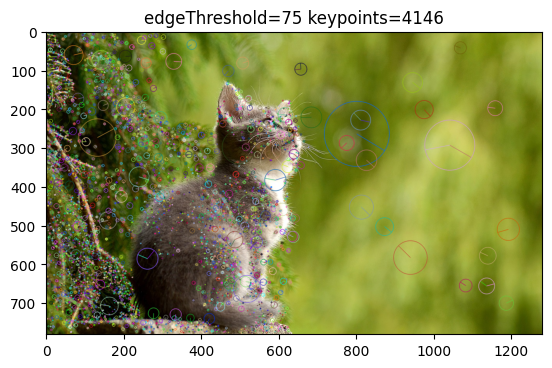

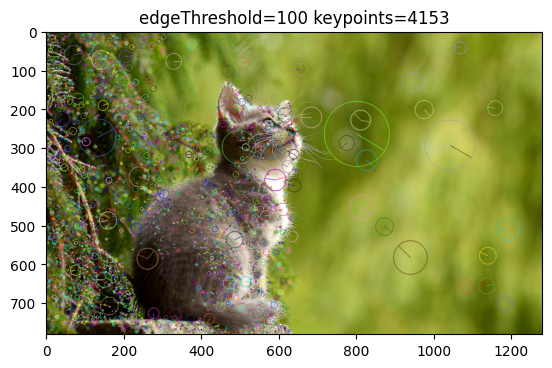

In [11]:
edgeThreshold = [5, 10, 15, 20, 30, 50, 60, 75, 100]
detected_points = []
for n in edgeThreshold:
    img, kp = sift(img_filepath=fp1, edgeThreshold=n)
    detected_points.append(len(kp))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"edgeThreshold={n} keypoints={len(kp)}")
    plt.show()

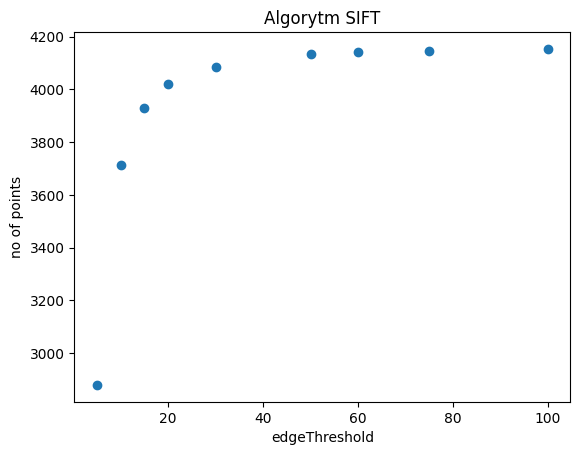

In [12]:
plt.scatter(edgeThreshold, detected_points)
plt.xlabel("edgeThreshold")
plt.ylabel("no of points")
plt.title("Algorytm SIFT")
plt.show()

## Różne wartości parametru sigma

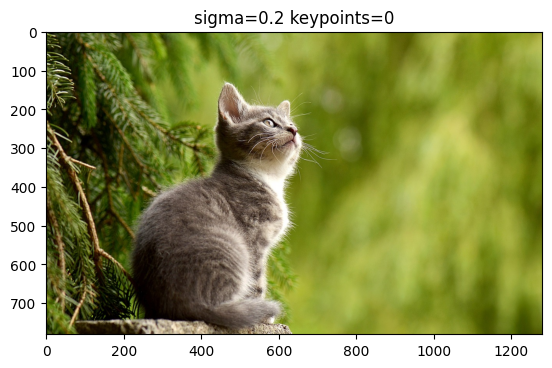

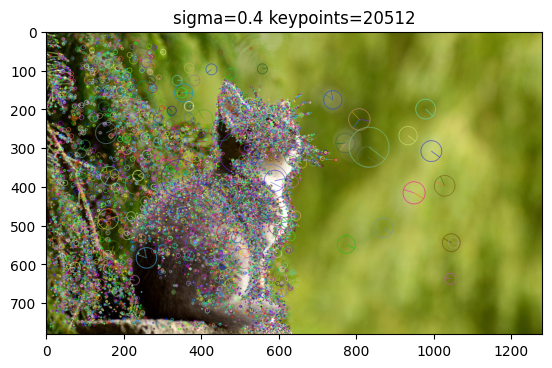

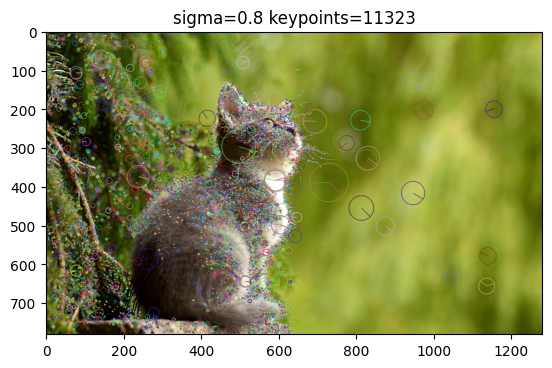

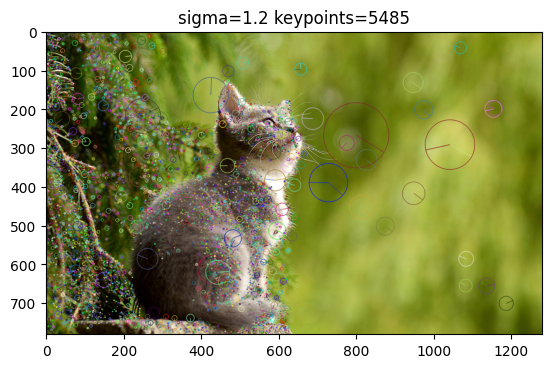

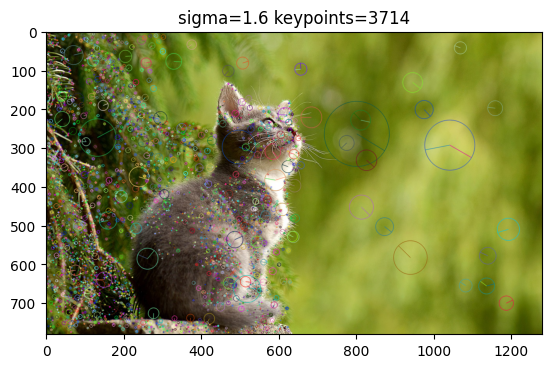

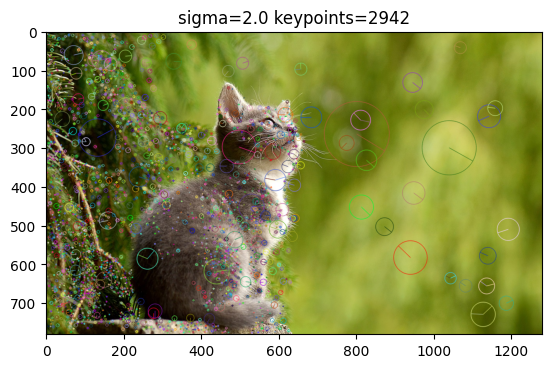

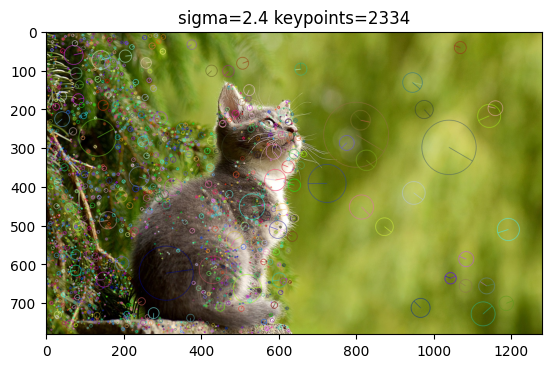

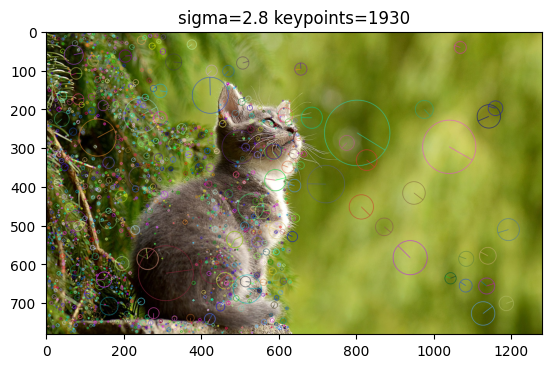

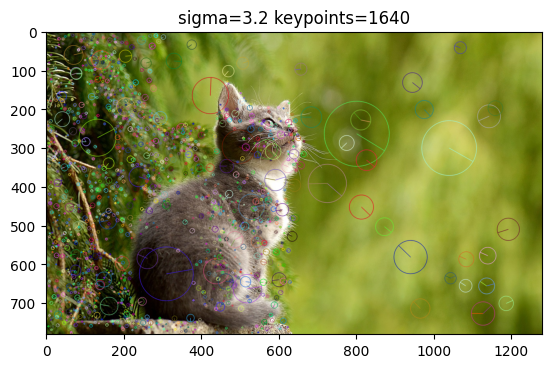

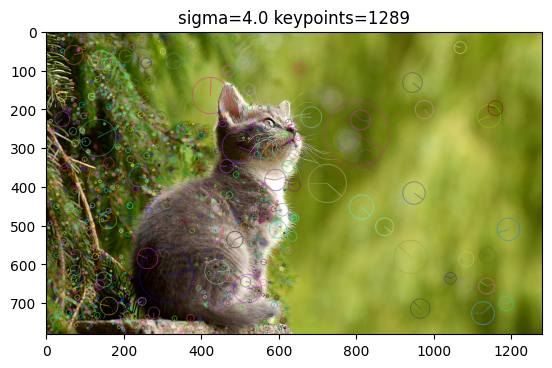

In [13]:
sigma = [0.2, 0.4, 0.8, 1.2, 1.6, 2.0, 2.4, 2.8, 3.2, 4.0]
detected_points = []
for n in sigma:
    img, kp = sift(img_filepath=fp1, sigma=n)
    detected_points.append(len(kp))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"sigma={n} keypoints={len(kp)}")
    plt.show()

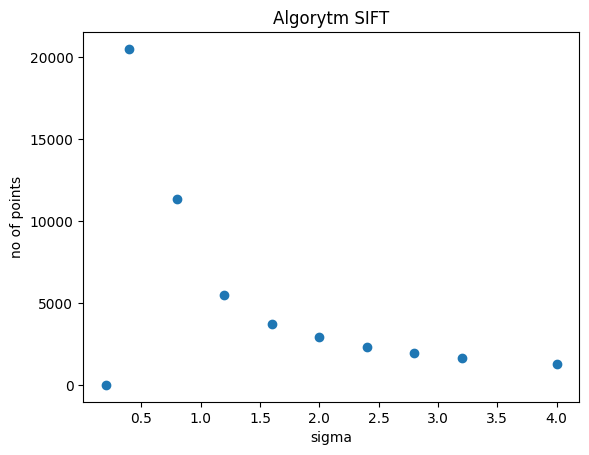

In [14]:
plt.scatter(sigma, detected_points)
plt.xlabel("sigma")
plt.ylabel("no of points")
plt.title("Algorytm SIFT")
plt.show()

# Detektor MSER (Maximally Stable Extremal Regions)

In [15]:
hulls, regions, bboxes = mser(img_filepath=fp2)

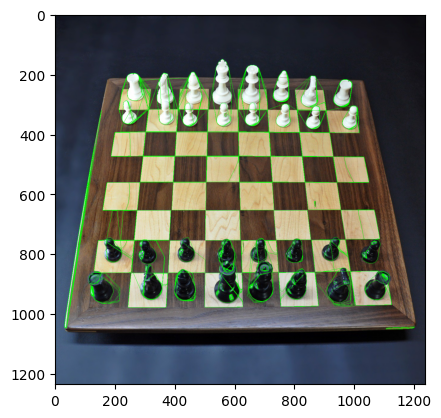

In [16]:
img = cv2.imread(fp2)
cv2.polylines(img, hulls, 1, (0, 255, 0))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

# cv2.imshow('img', img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

# Detektor SimpleBlobDetector

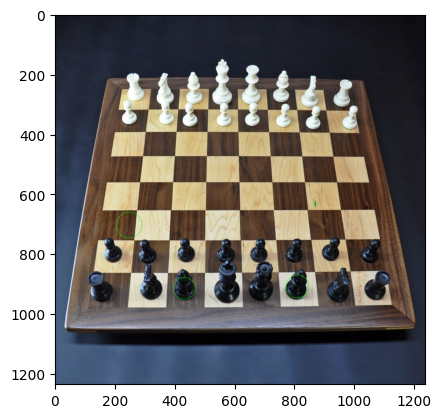

In [17]:
img = cv2.imread(fp2)
img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

parametry = cv2.SimpleBlobDetector_Params()
# Zmiana wartości progu binaryzacji
parametry.minThreshold = 10;
parametry.maxThreshold = 2000;
# Filtracja po polu powierzchni.
parametry.filterByArea = True
parametry.minArea = 100
# Filtracja względem odstępstwa od okręgu
parametry.filterByCircularity = True
parametry.minCircularity = 0.01
# Filtracja względem wypełnienia blobu
parametry.filterByConvexity = True
parametry.minConvexity = 0.87
# Filtracja po stosunku półosi elipsy
parametry.filterByInertia = True
parametry.minInertiaRatio = 0.01
detector = cv2.SimpleBlobDetector_create(parametry)

# Wykrywanie blobów
keypoints = detector.detect(img_grey)
# Wyświetlanie punktów charakterystycznych w postaci okręgów
img_blobs = cv2.drawKeypoints(img, keypoints, np.array([]), (0,255,0), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(cv2.cvtColor(img_blobs, cv2.COLOR_BGR2RGB))
plt.show()

# cv2.imshow("Zdjecie z zaznaczonymi blobami", img_blobs)
# cv2.waitKey(0)


# THE END

In [ ]:
# # Funkcje Janka
# def sift():
#     # sift
#     zdjecie = cv2.imread('lena.png')
#     szareZdjecie = cv2.cvtColor(zdjecie, cv2.COLOR_BGR2GRAY) # Konwersja obrazu do postaci zdjęcia w odcieniach szarości
#     sift = cv2.SIFT_create(nfeatures = 0, nOctaveLayers = 3, contrastThreshold = 0.1, edgeThreshold = 10, sigma = 1.6)
#     kp, descriptor = sift.detectAndCompute(szareZdjecie,None)
#     print(descriptor)
#     zdjecie =cv2.drawKeypoints(zdjecie , kp,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
#     cv2.imwrite('sift_keypoints.jpg', zdjecie)

#     # Zmiana parametrów detektor SIFT
#     #sift = cv2.SIFT_create(nfeatures = 0, nOctaveLayers = 3, contrastThreshold = 0.04, edgeThreshold = 100, sigma = 1.6)
#     #nfeatures - Liczba najlepszych cech do zachowania. Cechy są uszeregowane według ich punktacji (mierzonej w algorytmie SIFT jako lokalny kontrast)
#     i = 0
#     for k in kp:
#         i+= 1

#     print(i)

#     cv2.imshow("Zdjecie z zaznaczonymi blobami", zdjecie)
#     cv2.waitKey(0)


# def akaze():
#     print("akaze")
#     zdjecie = cv2.imread('lena.png')
#     szareZdjecie = cv2.cvtColor(zdjecie, cv2.COLOR_BGR2GRAY)
#     akaze = cv2.AKAZE_create()
#     kp, descriptor = akaze.detectAndCompute(szareZdjecie, None)
#     print(descriptor)
#     zdjecie = cv2.drawKeypoints(zdjecie, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
#     cv2.imwrite('akaze_keypoints.jpg', zdjecie)

#     cv2.imshow("Zdjecie z zaznaczonymi blobami", zdjecie)
#     cv2.waitKey(0)

# def brisk():
#     print("brisk")
#     zdjecie = cv2.imread('lena.png')
#     szareZdjecie = cv2.cvtColor(zdjecie, cv2.COLOR_BGR2GRAY)
#     brisk = cv2.BRISK_create()
#     kp, descriptor = brisk.detectAndCompute(szareZdjecie, None)
#     print(descriptor)
#     zdjecie = cv2.drawKeypoints(zdjecie, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
#     cv2.imwrite('brisk_keypoints.jpg', zdjecie)

#     cv2.imshow("Zdjecie z zaznaczonymi blobami", zdjecie)
#     cv2.waitKey(0)

# def orb():
#     print("orb")
#     zdjecie = cv2.imread('lena.png')
#     szareZdjecie = cv2.cvtColor(zdjecie, cv2.COLOR_BGR2GRAY)
#     orb = cv2.ORB_create()
#     kp, descriptor = orb.detectAndCompute(szareZdjecie, None)
#     print(descriptor)
#     zdjecie = cv2.drawKeypoints(zdjecie, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
#     cv2.imwrite('orb_keypoints.jpg', zdjecie)

#     cv2.imshow("Zdjecie z zaznaczonymi blobami", zdjecie)
#     cv2.waitKey(0)

# def kaze():
#     print("kaze")
#     zdjecie = cv2.imread('lena.png')
#     szareZdjecie = cv2.cvtColor(zdjecie, cv2.COLOR_BGR2GRAY)
#     kaze = cv2.KAZE_create()
#     kp, descriptor = kaze.detectAndCompute(szareZdjecie, None)
#     print(descriptor)
#     zdjecie = cv2.drawKeypoints(zdjecie, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
#     cv2.imwrite('kaze_keypoints.jpg', zdjecie)

#     cv2.imshow("Zdjecie z zaznaczonymi blobami", zdjecie)
#     cv2.waitKey(0)
